---
title: Results (Julia)
---

In [1]:
using AlgebraOfGraphics
using AlgebraOfGraphics: density
using CairoMakie
using DataFrames
using DataFramesMeta
using Arrow
using PartialFunctions
using LaTeXStrings
using RCall
using Statistics
using beforerr

set_aog_theme!()

include("utils.jl")

:j0_k_norm => (log10 => L"Log Normalized Current Density ($J_A$)")

In [2]:
begin
    j_events_low_fit = load()
    j_events_tau_20_fit = load(tau = 20)
    j_events_high_fit = load(ts = 0.12)

    dir = "../data/05_reporting"
    w_events = load("$dir/events.Wind.fit.ts_0.09s_tau_60s.arrow")

    # add a label column to the dataframes
    j_events_low_fit[!, :label] .= "1 Hz (fit)"
    j_events_high_fit[!, :label] .= "8 Hz (fit)"
    j_events_tau_20_fit[!, :label] .= "1 Hz, 20s (fit)"


    # filter high time resolution events
    j_events_high_fit = @chain j_events_high_fit begin
        filter(:len => >(240), _)
    end

    # combine the dataframes
    j_events = reduce(vcat, [j_events_low_fit, j_events_high_fit, j_events_tau_20_fit])

    println("Number of events: ", size(j_events, 1))
end

┌ Warning: automatically converting Arrow.Timestamp with precision = NANOSECOND to `Dates.DateTime` which only supports millisecond precision; conversion may be lossy; to avoid converting, pass `Arrow.Table(source; convert=false)
└ @ Arrow /Users/zijin/.julia/packages/Arrow/Y6R1E/src/eltypes.jl:273


Number of events: 61879


In [41]:
function load_tau(tau)
    df = load(tau=tau)
    df.label .= "$tau s"
    println("Number of events: ", size(df, 1))
    df
end

j_events_taus = 60:-10:20 .|> load_tau |> x -> reduce(vcat, x)

Number of events: 20875
Number of events: 22721
Number of events: 24788
Number of events: 28132
Number of events: 32944


Row,time,tstart,tstop,t.d_end,t.d_start,t.d_time,index_diff,len,std,std_prev,std_next,index_std,index_fluctuation,B.after,B.before,b_mag,b_n,bn_over_b,d_star,db_mag,db_over_b,db_over_b_max,fit.stat.chisqr,fit.stat.rsquared,fit.vars.amplitude,fit.vars.c,fit.vars.sigma,rotation_angle,dB_x,dB_y,dB_z,dB_lmn_x,dB_lmn_y,dB_lmn_z,k_x,k_y,k_z,Vl_x,Vl_y,Vl_z,Vn_x,Vn_y,Vn_z,duration,radial_distance,plasma_density,plasma_temperature,model_b_r,model_b_t,model_b_n,v_x,v_y,v_z,plasma_speed,B_background_x,B_background_y,B_background_z,n.before,v_x_before,v_y_before,v_z_before,n.after,v_x_after,v_y_after,v_z_after,v_l,v_n,v_k,L_k,j0_k,ion_inertial_length,Alfven_speed,j_Alfven,L_k_norm,j0_k_norm,v.ion.before.l,v.ion.after.l,B.vec.before.l,B.vec.before.m,B.vec.before.n,B.vec.after.l,B.vec.after.m,B.vec.after.n,v.Alfven.before,v.Alfven.after,v.Alfven.before.l,v.Alfven.after.l,n.change,v.ion.change.l,B.change,v.Alfven.change,v.Alfven.change.l,r,tau,ts,label
,DateTime,DateTime,DateTime,DateTime,DateTime,DateTime,Float64,UInt32,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,String,Int64,Float64,String
1,2011-08-25T18:12:30,2011-08-25T18:12:00,2011-08-25T18:13:00,2011-08-25T18:12:57.486,2011-08-25T18:12:30.486,2011-08-25T18:12:36.173,1.14981,60,1.95579,0.628646,0.685787,2.85189,1.05109,3.37203,3.5425,3.37998,-0.144132,-0.0426429,0.509614,-0.170467,0.0504343,0.0998766,1.97526,0.977238,6.01329,-3.83732,2.94992,104.502,2.8,-3.52,3.11,-5.45497,0.15795,0.347617,0.577467,0.748131,0.326853,0.566137,-0.599601,0.565656,0.55045,0.78579,0.282027,5.89985,1.005,2.32783,80537.0,-0.845528,1.85755,0.458,427.406,-9.01539,0.1,427.501,-2.00556,1.79726,1.97153,2.30175,427.554,-9.22503,0.0791532,2.30081,427.559,-9.23257,0.0784032,247.433,228.21,240.101,1416.56,1.68903,149.261,48.3077,18.0168,9.49049,0.0937474,247.63,247.637,-2.89763,-2.03174,0.158264,2.55734,-2.18969,-0.189354,50.9165,48.4763,-41.6478,36.7643,-0.000938325,0.00710056,-0.170467,-2.44025,78.4121,1,60,1.0,60 s
2,2011-08-25T18:36:30,2011-08-25T18:36:00,2011-08-25T18:37:00,2011-08-25T18:36:09.483,2011-08-25T18:36:01.483,2011-08-25T18:36:05.538,1.52996,60,1.5683,0.322511,0.527596,2.97254,2.90678,3.33308,3.50956,3.24918,-0.738451,-0.227273,3.09525,-0.176482,0.0543158,0.275661,0.0725433,0.998858,5.99665,-3.06219,0.484343,128.896,0.77,-6.09,0.66,-6.15597,-0.0421761,0.467823,0.523579,0.156952,0.837395,0.185734,-0.971115,0.149797,0.843537,0.235769,0.482553,0.968685,1.004,2.20272,80800.0,-0.733703,1.68538,0.42,428.113,-10.021,0.0,428.231,-3.04827,-0.0861056,0.617642,2.25271,427.831,-9.61917,0.0399588,2.25243,427.832,-9.62141,0.0397366,89.2467,358.767,222.579,215.609,11.0663,153.441,47.7389,16.8477,1.40516,0.656842,88.81,88.8124,-3.21852,-1.32755,-0.442442,2.93745,-1.28538,-0.910265,50.9891,48.4281,-46.7607,42.6798,-0.000278022,0.00242874,-0.176482,-2.56105,89.4405,1,60,1.0,60 s
3,2011-08-25T19:37:30,2011-08-25T19:37:00,2011-08-25T19:38:00,2011-08-25T19:37:27.493,2011-08-25T19:37:01.493,2011-08-25T19:37:20.348,0.581307,60,0.957243,0.41671,0.272821,2.29714,1.47977,3.78547,3.63997,3.71285,-2.76349,-0.744304,0.155323,0.1455,0.0391881,0.0609006,0.955481,0.959954,4.16602,-1.39409,6.70542,44.2299,-0.51,-2.26,1.57,-2.76648,-0.390797,0.162634,0.428147,0.448436,0.784599,-0.157486,-0.716398,0.679686,0.964654,0.0356548,0.261095,13.4108,1.004,2.11358,82114.0,-0.689713,1.582,0.412,428.838,-13.355,0.1,429.046,-2.07814

In [4]:
j_events_low_der = load(method="derivative")
j_events_high_der = load(ts = 0.12, method="derivative")

j_events_low_der[!, :label] .= "1 Hz (derivative)"
j_events_high_der[!, :label] .= "8 Hz (derivative)"
j_events_der = vcat(j_events_low_der, j_events_high_der, cols=:intersect)

Row,time,tstart,tstop,t.d_end,t.d_start,t.d_time,index_diff,len,std,std_prev,std_next,index_std,index_fluctuation,d_star,B.after,B.before,b_mag,b_n,bn_over_b,db_mag,db_over_b,db_over_b_max,rotation_angle,dB_x,dB_y,dB_z,dB_lmn_x,dB_lmn_y,dB_lmn_z,k_x,k_y,k_z,Vl_x,Vl_y,Vl_z,Vn_x,Vn_y,Vn_z,duration,radial_distance,plasma_density,plasma_temperature,model_b_r,model_b_t,model_b_n,v_x,v_y,v_z,plasma_speed,B_background_x,B_background_y,B_background_z,n.before,v_x_before,v_y_before,v_z_before,n.after,v_x_after,v_y_after,v_z_after,v_l,v_n,v_k,L_k,j0_k,ion_inertial_length,Alfven_speed,j_Alfven,L_k_norm,j0_k_norm,v.ion.before.l,v.ion.after.l,B.vec.before.l,B.vec.before.m,B.vec.before.n,B.vec.after.l,B.vec.after.m,B.vec.after.n,v.Alfven.before,v.Alfven.after,v.Alfven.before.l,v.Alfven.after.l,n.change,v.ion.change.l,B.change,v.Alfven.change,v.Alfven.change.l,r,tau,ts,label
,DateTime,DateTime,DateTime,DateTime,DateTime,DateTime,Float64,UInt32,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,String,Int64,Float64,String
1,2011-08-25T15:54:30,2011-08-25T15:54:00,2011-08-25T15:55:00,2011-08-25T15:54:19.500,2011-08-25T15:54:13.500,2011-08-25T15:54:15.500,0.454745,60,0.810663,0.238493,0.313628,2.58479,1.74924,0.494419,3.54272,3.58163,3.54382,3.47558,0.980743,-0.0389088,0.0109793,0.0248571,23.3528,0.26,-0.52,1.32,-1.42862,-0.195891,0.032567,0.741752,0.660873,0.114241,0.0723711,-0.443734,0.893232,-0.731645,0.58503,0.349907,6.0,1.004,2.85307,80800.0,-0.725192,2.28581,0.281,431.292,-16.8446,-0.0,431.62,-1.94684,2.05757,1.45917,2.85307,431.292,-16.8446,-0.0,2.85307,431.292,-16.8446,-0.0,38.6876,325.407,308.779,1852.68,1.2742,134.823,45.7503,20.913,13.7415,0.0609285,38.6876,38.6876,-0.787022,0.300817,3.48112,0.641602,0.496708,3.44855,46.2384,45.7361,-10.1603,8.283,0.0,0.0,-0.0389088,-0.502307,18.4433,1,60,1.0,1 Hz (derivative)
2,2011-08-25T16:12:00,2011-08-25T16:11:30,2011-08-25T16:12:30,2011-08-25T16:12:12.498,2011-08-25T16:12:07.498,2011-08-25T16:12:09.498,0.495007,60,1.11719,0.316177,0.557412,2.00425,1.12462,0.942603,3.57505,3.50203,3.51381,-0.204569,-0.0582186,0.0730245,0.0207821,0.0359684,46.4435,-0.79,-0.55,2.62,-2.79044,-0.044947,0.0490867,0.700717,0.62577,0.342649,-0.279839,-0.174058,0.944136,0.742809,0.583772,0.327789,5.0,1.004,2.85307,80800.0,-0.725192,2.28581,0.281,431.292,-16.8446,-0.0,431.62,-1.94684,2.05757,1.45917,2.81552,430.737,-15.511,0.0202083,2.81526,430.734,-15.5018,0.0203472,-117.76,310.534,291.672,1458.36,2.57172,134.823,45.3628,20.7359,10.8168,0.124023,-117.818,-117.819,-1.25377,-3.26559,-0.167837,1.53668,-3.22065,-0.216924,45.5112,46.4623,-16.2935,19.9711,-0.000258056,-0.000398398,0.0730245,0.951131,36.2646,1,60,1.0,1 Hz (derivative)
3,2011-08-25T16:14:00,2011-08-25T16:13:30,2011-08-25T16:14:30,2011-08-25T16:13:58.498,2011-08-25T16:13:47.498,2011-08-25T16:13:50.498,0.709049,60,1.69707,0.557412,0.421622,3.04456,1.14809,0.8757,3.50344,3.54924,3.51288,0.561596,0.159868,-0.0457982,0.0130372,0.0372845,81.0004,1.43,0.6,4.31,-4.57912,0.112352,0.00701283,0.692433,0.646746,-0.319774,0.298756,0.15153,0.942223,-0.81238,-0.47771,0.334412,11.0,1.004,2.85307,80800.0,-0.725192,2.28581,0.281,431.292,-16.8446,-0.0,431.62,-1.94684,2.05757,1.45917,2.81036,430.661,-15.3277,0.0229861,2.80979,430.653,-15.3075,0.0232916,126.298,342.326,287.746,3165.21,2.42178,134.823,45.3508,20.7304,23.4767,0.116823,126.362,126.363,-2.25961,2.6796,0.557655,2.31951,2.56725,0.550642,46.167,45.5759

In [5]:
begin
    log_axis = (yscale=log10, xscale=log10)

    j_limit = (10^-1, 10^1)
    j_norm_limit = (10^-2, 2)
end

(0.010000000000000002, 2)

## Check the effect of time window `tau`

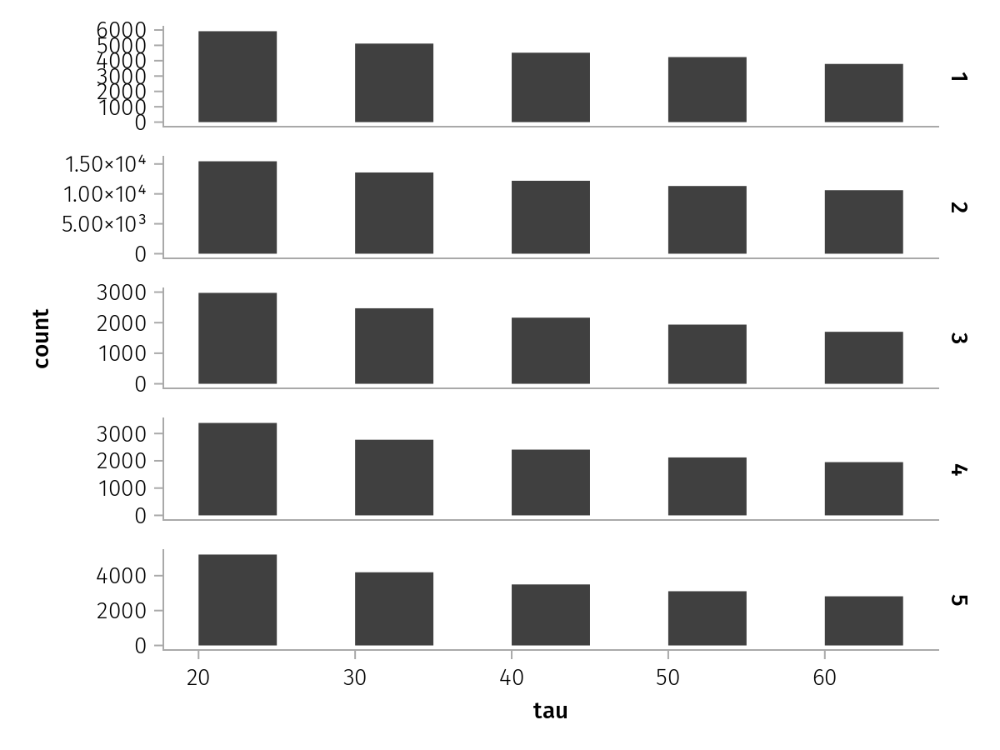

In [40]:
# plot the number of events with respect to tau in different radial distances

specs = data(j_events_taus) * mapping(:tau, row=:r) * histogram()
draw(specs, facet=(; linkyaxes=:none))

In [47]:
# get unique events defined by the starting time and ending time
cols = [:"t.d_start", :"t.d_end"]

println("Number of events: ", size(j_events_taus, 1))
j_events_taus_u = unique(j_events_taus, cols)
println("Number of unique events: ", size(j_events_taus_u, 1))

Number of events: 129460
Number of unique events: 88679


## Check the discontinuities properties with radial distance

In [6]:
datalimits_f = x -> quantile(x, [0.05, 0.97])

#18 (generic function with 1 method)

In [7]:
# NOTE: log axis for density is not working now
function plot_l_j_r(df)
    fig = Figure(size=(1000, 1000))

    plt = data(df) * mapping(row=:r, color=:label)
    plt = plt * density(datalimits=datalimits_f)

    plt1 = plt * mapping(l_map)
    plt2 = plt * mapping(l_norm_map)
    plt3 = plt * mapping(j_map)
    plt4 = plt * mapping(j_norm_map)

    axis = (; yscale = identity)
    
    # axis = (; yscale=log10, limits=(nothing, nothing, 10^-3, 1))
    # l_axis = (; yscale = log10, limits=(nothing, (10^-5, 10^-3)))
    # l_norm_axis = (; yscale = log10, limits=(nothing, (10^-3, 1)))

    grid1 = draw!(fig[1:5, 1], plt1, axis=axis)
    grid2 = draw!(fig[1:5, 2], plt2, axis=axis)
    grid3 = draw!(fig[1:5, 3], plt3, axis=axis)
    grid4 = draw!(fig[1:5, 4], plt4, axis=axis)
    legend!(fig[0, 1:end], grid1, titleposition=:left, orientation=:horizontal)

    fig
end

plot_l_j_r (generic function with 1 method)

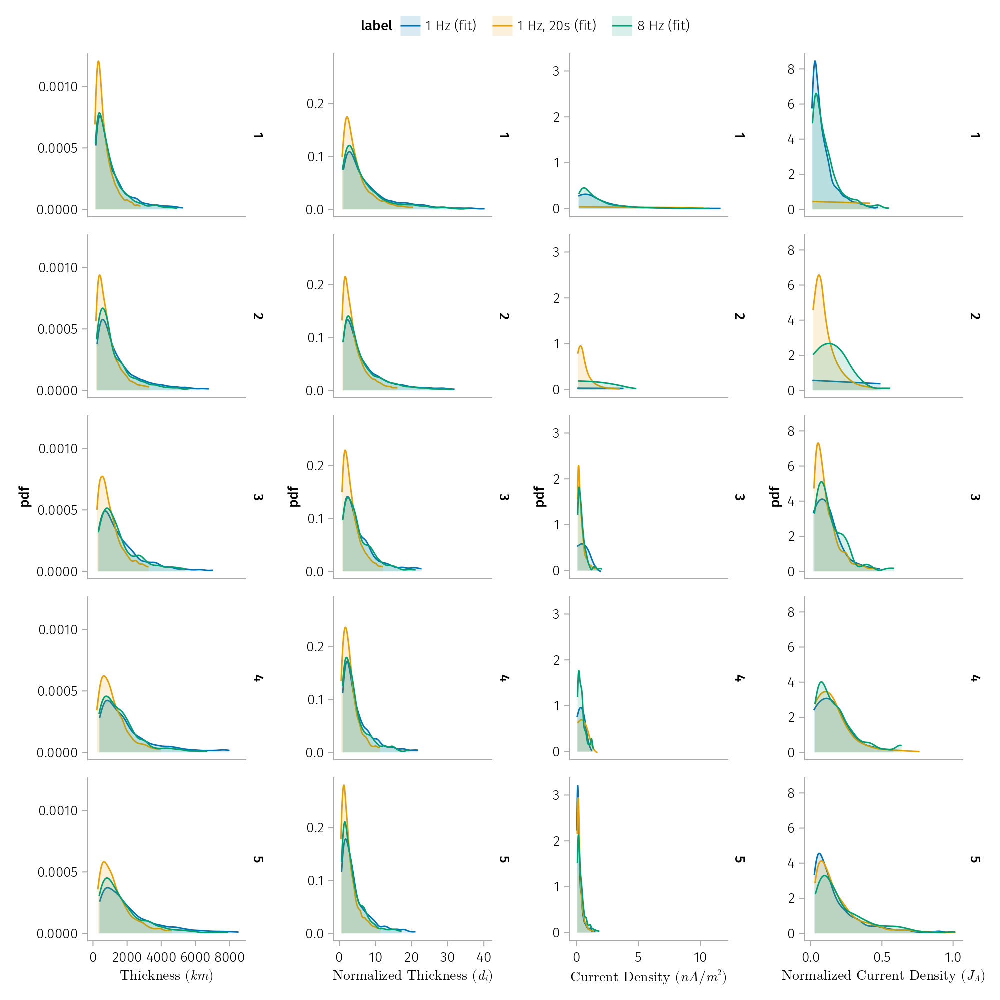

In [6]:
plot_l_j_r(j_events)

In [11]:
B_lab = L"Fitted Amplitude ($nT$)"

b_map = :"fit.vars.amplitude" => log ∘ abs => B_lab

"fit.vars.amplitude" => (log ∘ abs => L"Fitted Amplitude ($nT$)")

In [ ]:
function plot_l_j_r_hist(
    df;
    maps=(l_map, l_norm_map, j_map, j_norm_map),
    f_maps=(row=:r, color=:label),
    normalization=:pdf,
    fig_options = (size = (1200, 1000),)
)
    fig = Figure(fig_options)

    plt = data(df) * mapping(; f_maps...) * (visual(Lines) + visual(Scatter))
    plt *= histogram(datalimits=datalimits_f, normalization=normalization)

    plts = [plt * mapping(m) for m in maps]
    axis = (; yscale=log10)

    grids = [draw!(fig[1:5, i], p, axis=axis) for (i, p) in enumerate(plts)]
    legend!(fig[0, 1:end], grids[1], titleposition=:left, orientation=:horizontal)

    fig
end

plot_l_j_r_hist (generic function with 1 method)

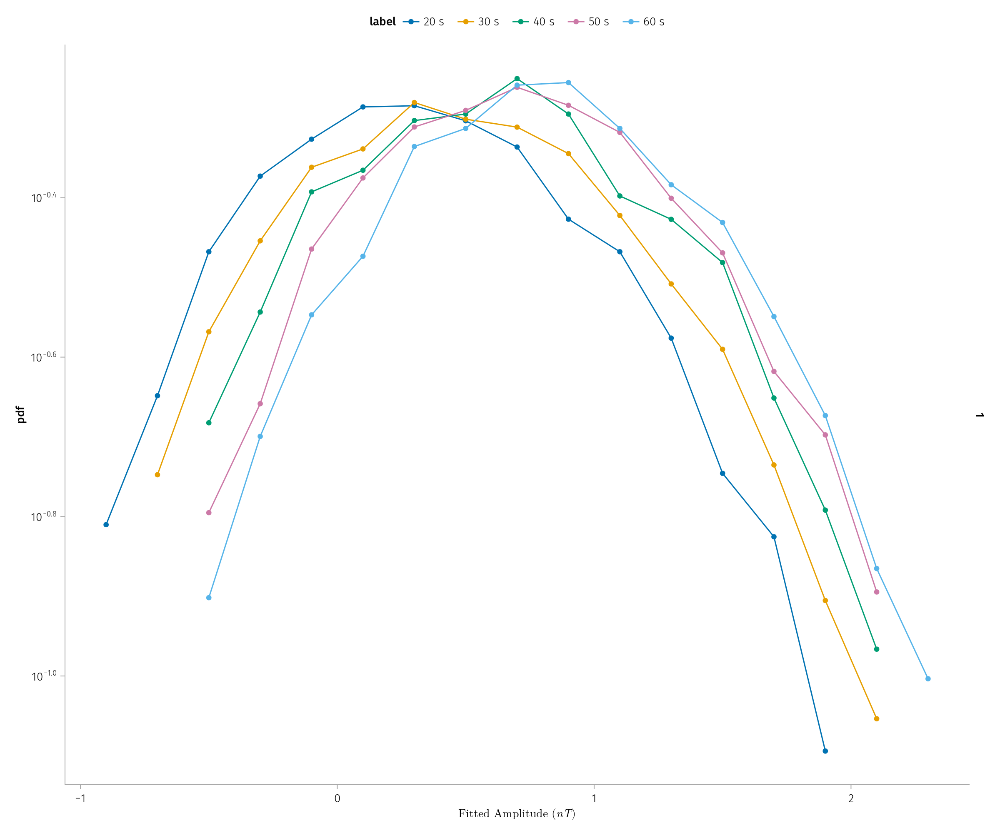

In [ ]:
df = @chain j_events_taus begin
    filter(:r => ==("1"), _)
end

plot_l_j_r_hist(df ; maps=(b_map,))

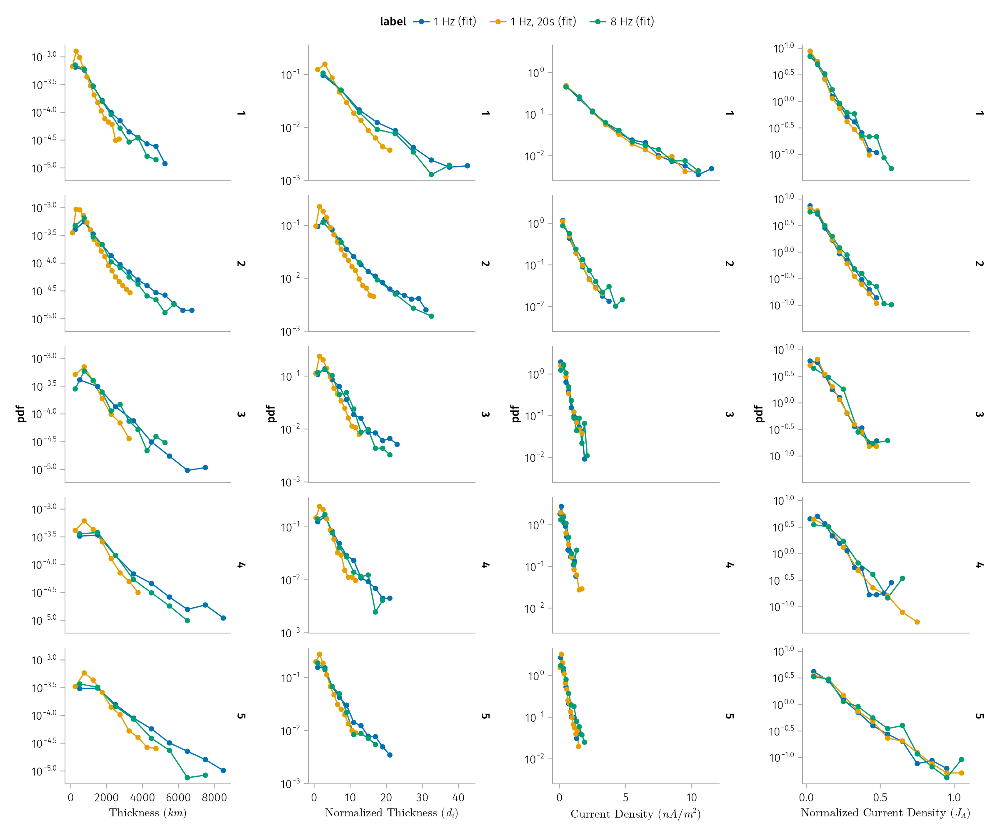

In [8]:
#| label: fig-l-j-r-fit
plot_l_j_r_hist(j_events)

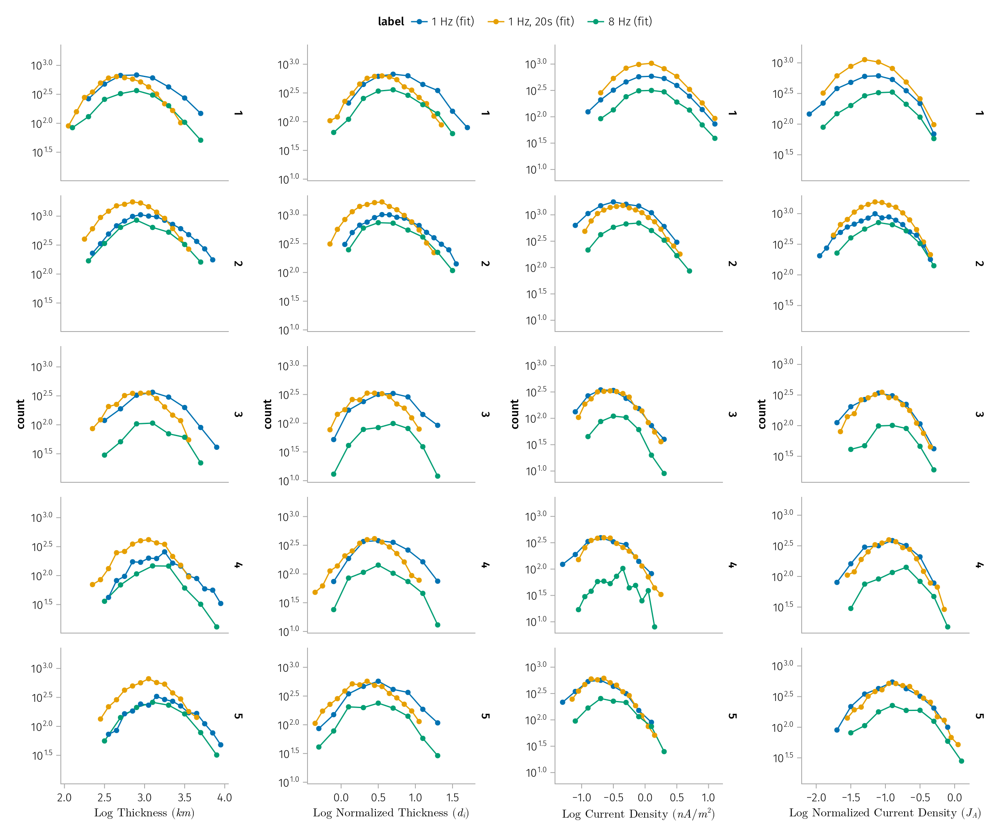

In [9]:
maps = (l_log_map, l_norm_log_map, j_log_map, j_norm_log_map)
plot_l_j_r_hist(j_events; maps = maps, normalization = :none)

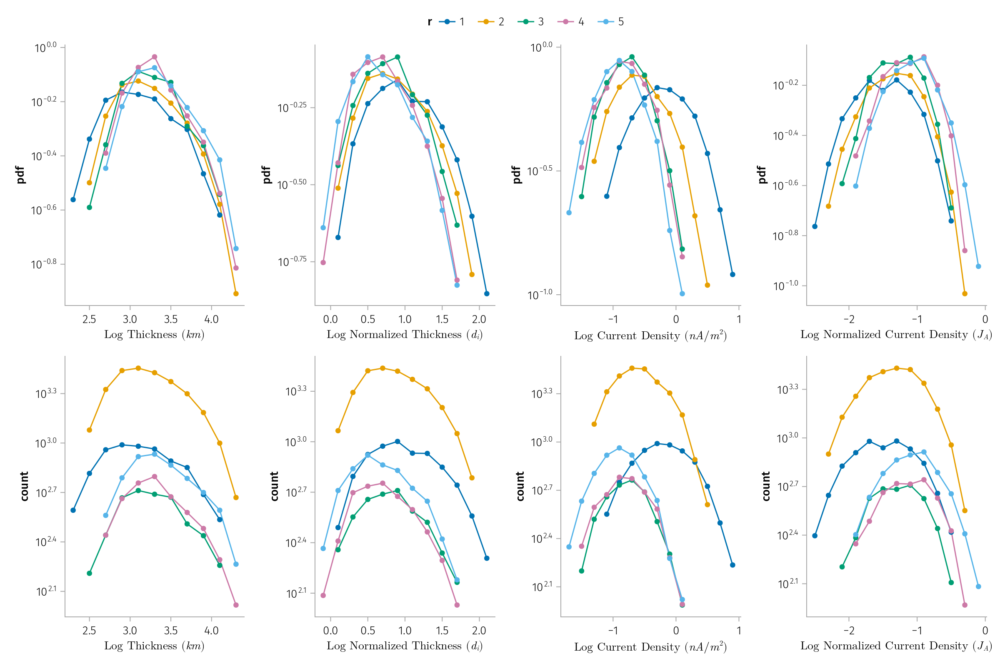

In [15]:
#| column: page
function plot_l_j_r_hist(
    df;
    maps=(l_map, l_norm_map, j_map, j_norm_map),
    f_maps = (color=:r,),
    size = (1200, 800),
)
    fig = Figure(size=size)
    axis = (; yscale=log10)

    plt = data(df) * mapping(; f_maps...) * (visual(Lines) + visual(Scatter))
    plt_h = plt * histogram(datalimits=datalimits_f, normalization=:pdf)
    plts = [plt_h * mapping(m) for m in maps]
    grids = [draw!(fig[1, i], p, axis=axis) for (i, p) in enumerate(plts)]


    plt_h = plt * histogram(datalimits=datalimits_f)
    plts = [plt_h * mapping(m) for m in maps]
    grids = [draw!(fig[2, i], p, axis=axis) for (i, p) in enumerate(plts)]
    legend!(fig[0, 1:end], grids[1], titleposition=:left, orientation=:horizontal)

    fig
end

plot_l_j_r_hist(j_events_low_fit; maps=maps, f_maps=f_maps)

In [49]:
@rput j_events
@rput j_events_taus
@rput j_events_taus_u
@rput j_events_low_fit
@rput j_events_tau_20_fit


R"""
library(ggplot2)
library(ggpubr)
library(patchwork)
source('utils.R')
"""

RObject{VecSxp}
$value
function (df1, df2, p1title = p1title, y_lim_1 = c(500, 40000), 
    y_lim_2 = c(1, 200)) 
{
    x_col <- "radial_distance"
    x_bins <- 5
    y_bins <- 12
    add_mode <- TRUE
    y_col <- "L_k"
    y_lim <- y_lim_1
    ylab <- lab_l_log
    p <- plot_binned_data(df1, x_col = x_col, y_col = y_col, 
        x_bins = x_bins, y_bins = y_bins, y_lim = y_lim, y_log = TRUE, 
        add_mode = add_mode)
    p1 <- p + labs(x = NULL, y = ylab) + ggtitle(p1title)
    y_col <- "L_k_norm"
    y_lim <- y_lim_2
    ylab <- lab_l_norm_log
    p <- plot_binned_data(df1, x_col = x_col, y_col = y_col, 
        x_bins = x_bins, y_bins = y_bins, y_lim = y_lim, y_log = TRUE, 
        add_mode = add_mode)
    p2 <- p + labs(x = x_lab_r, y = ylab)
    x_col <- "time"
    y_col <- "L_k"
    y_lim <- y_lim_1
    p <- plot_binned_data(df2, x_col = x_col, y_col = y_col, 
        x_bins = x_bins, y_bins = y_bins, y_lim = y_lim, y_log = TRUE, 
        add_mode = add_mode)
    p3 <- p + la

In [10]:
#| output: false

R"""
density_plot <- function(df,
  x,
  density.y = "density",
  facet.by = "r",
  color = "label",
  strip.position = "top")
{
  p <- ggdensity(
    df, 
    x = x, y = density.y,
    color = color,
    facet.by = facet.by,
    add = "median",
    alpha = 0
  ) %>%
  facet(facet.by, ncol = 1, strip.position = strip.position)
}

plot <- function(
  df,
  d1_ulim = 8000,
  d2_ulim = 40,
  d3_ulim = 8,
  d4_ulim = 1.2,
  xscale = "none",
  yscale = "log10",
  p1_xlim = NULL,
  p1_ylim = NULL,
  p2_xlim = NULL,
  p2_ylim = NULL, # c(10^-3, 1)
  p3_xlim = NULL, p3_ylim = NULL,
  p4_xlim = NULL, p4_ylim = NULL,
  plot_func = density_plot,
  ...
) {

  p1 <- plot_func(
    filter(df, L_k < d1_ulim), "L_k", ...
  )
  
  p2 <- plot_func(
    filter(df, L_k_norm < d2_ulim), "L_k_norm", ...
  )
  
  p3 <- plot_func(
    filter(df, j0_k < d3_ulim), "j0_k", ...
  )
  
  p4 <- plot_func(
    filter(df, j0_k_norm < d4_ulim), "j0_k_norm", strip.position = "right", ...
  )

  p1 <- ggpar(p1,
      xscale=xscale, xlim = p1_xlim,
      yscale=yscale, ylim = p1_ylim
    ) + labs(x = lab_l)
  
  p2 <- ggpar(p2, 
      xscale=xscale, xlim = p2_xlim,
      yscale=yscale, ylim = p2_ylim, ylab=FALSE
    ) + labs(x = lab_l_norm)
  
  p3 <- ggpar(p3,
      xscale=xscale, xlim = p3_xlim,
      yscale=yscale, ylim = p3_ylim, ylab=FALSE
    ) + labs(x = lab_j)
  
  p4 <- ggpar(p4,
      xscale=xscale, xlim = p4_xlim,
      yscale=yscale, ylim = p4_ylim, ylab=FALSE
    ) + labs(x = lab_j_norm)
  
  tag_pool <- unique(df$r)
  
  p1 <- tag_facet(p1, open = "(a.", tag_pool = tag_pool)
  p2 <- tag_facet(p2, open = "(b.", tag_pool = tag_pool)
  p3 <- tag_facet(p3, open = "(c.", tag_pool = tag_pool)
  p4 <- tag_facet(p4, open = "(d.", tag_pool = tag_pool) + theme(
    strip.background = element_blank(),
    strip.text.x = element_blank()
  )

  p <- p1 + p2 + p3 + p4
  p <- p + plot_layout(nrow = 1, guides = "collect") & theme(legend.position='top')  
}
"""

RObject{ClosSxp}
function (df, d1_ulim = 8000, d2_ulim = 40, d3_ulim = 8, d4_ulim = 1.2, 
    xscale = "none", yscale = "log10", p1_xlim = NULL, p1_ylim = NULL, 
    p2_xlim = NULL, p2_ylim = NULL, p3_xlim = NULL, p3_ylim = NULL, 
    p4_xlim = NULL, p4_ylim = NULL, plot_func = density_plot, 
    ...) 
{
    p1 <- plot_func(filter(df, L_k < d1_ulim), "L_k", ...)
    p2 <- plot_func(filter(df, L_k_norm < d2_ulim), "L_k_norm", 
        ...)
    p3 <- plot_func(filter(df, j0_k < d3_ulim), "j0_k", ...)
    p4 <- plot_func(filter(df, j0_k_norm < d4_ulim), "j0_k_norm", 
        strip.position = "right", ...)
    p1 <- ggpar(p1, xscale = xscale, xlim = p1_xlim, yscale = yscale, 
        ylim = p1_ylim) + labs(x = lab_l)
    p2 <- ggpar(p2, xscale = xscale, xlim = p2_xlim, yscale = yscale, 
        ylim = p2_ylim, ylab = FALSE) + labs(x = lab_l_norm)
    p3 <- ggpar(p3, xscale = xscale, xlim = p3_xlim, yscale = yscale, 
        ylim = p3_ylim, ylab = FALSE) + labs(x = lab_j)
    p4 <- ggpar(p4

### Properties over radial distance with different `tau` values

In [36]:
#| output: false
R"""
plot(
    j_events_taus,
    d1_ulim = Inf, p1_xlim = c(0,1e4), p1_ylim = c(1e-5, 1e-3),
    d2_ulim = 25, p2_xlim = c(0,25), p2_ylim = c(1e-2, 1e0),
    d3_ulim = 20, p3_xlim = c(0,8), p3_ylim = c(1e-2, 1e0),
    d4_ulim = 2, p4_xlim = c(0, 1), p4_ylim =  c(1e-1, 1e1),
)

save_plot("l_j_fit_taus", width = 15, height = 5)


plot(
    j_events_taus,
    xscale = "log10",
    d1_ulim = Inf, p1_xlim = c(1e2, 1e5), p1_ylim = c(1e-2, 1e0),
    d2_ulim = Inf, p2_xlim = c(1e-1, 1e2), p2_ylim = c(1e-2, 1e0),
    d3_ulim = Inf, p3_xlim = c(1e-2, 5e1), p3_ylim = c(1e-2, 1e0),
    d4_ulim = Inf, p4_xlim = c(1e-3, 5e0), p4_ylim = c(1e-2, 1e0),
)

save_plot("l_j_fit_taus_xscale_log", width = 15, height = 5)
"""

┌ Warning: RCall.jl: Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
└ @ RCall /Users/zijin/.julia/packages/RCall/dDAVd/src/io.jl:172
┌ Warning: RCall.jl: Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 tran

RObject{StrSxp}
../figures/l_j_fit_taus.pdf


In [61]:
#| output: false
R"""
plot(
    j_events_taus_u,
    xscale = "log10",
    d1_ulim = Inf, p1_xlim = c(1e2, 1e5), p1_ylim = c(1e-2, 1e0),
    d2_ulim = Inf, p2_xlim = c(1e-1, 1e2), p2_ylim = c(1e-2, 1e0),
    d3_ulim = Inf, p3_xlim = c(1e-2, 5e1), p3_ylim = c(1e-2, 1e0),
    d4_ulim = Inf, p4_xlim = c(1e-3, 5e0), p4_ylim = c(1e-2, 1e0),
    facet.by = NULL, color = "r"
)

save_plot("l_j_fit_xscale_log", width = 15, height = 5)

plot(
    j_events_taus_u,
    d1_ulim = Inf, p1_xlim = c(0, 1e4), p1_ylim = c(1e-5, 1e-3),
    d2_ulim = Inf, p2_xlim = c(0, 25), p2_ylim = c(1e-2, 1e0),
    d3_ulim = 20, p3_xlim = c(0,8), p3_ylim = c(1e-2, 1e0),
    d4_ulim = 2, p4_xlim = c(0, 1), p4_ylim =  c(1e-1, 1e1),
    facet.by = NULL, color = "r",
)

save_plot("l_j_fit", width = 15, height = 5)
"""

┌ Warning: RCall.jl: Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
└ @ RCall /Users/zijin/.julia/packages/RCall/dDAVd/src/io.jl:172
┌ Warning: RCall.jl: Warning in log(x, base) : NaNs produced
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning: Removed 1 row containing missing values or values outside the scale range
│ (`geom_text()`).
│ Warning in log(x, base) : NaNs produced
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning: Removed 1 row containing missing values or values outside the scale range


RObject{StrSxp}
../figures/l_j_fit.pdf


[l_j_fit](../figures/l_j_fit.png)

[l_j_fit_xscale_log](../figures/l_j_fit_xscale_log.png)

[l_j_fit_xscale_log_count](../figures/l_j_fit_xscale_log_count.png)


[l_j_fit_taus](../figures/l_j_fit_taus.png)

[l_j_fit_taus_xscale_log](../figures/l_j_fit_taus_xscale_log.png)

#### Check the effect of time resolution and time window

In [203]:
#| output: false
R"""
# plot(j_events_der)
# save_plot("l_j_r_der", width = 15, height = 10)
# plot(
#     j_events,
#     p1_ylim = c(1e-5, 1e-3),
# )
# save_plot("l_j_r_fit", width = 15, height = 10)

plot(
    j_events,
    xscale = "log10",
    d1_ulim = Inf, p1_xlim = c(1e2, 1e5), p1_ylim = c(1e-2, 1e0),
    d2_ulim = Inf, p2_xlim = c(1e-1, 1e2), p2_ylim = c(1e-2, 1e0),
    d3_ulim = Inf, p3_xlim = c(1e-2, 5e1), p3_ylim = c(1e-2, 1e0),
    p4_xlim = c(1e-3, 5e0), p4_ylim = c(1e-2, 1e0),
)
save_plot("l_j_r_fit_xscale_log", width = 15, height = 10)
"""

┌ Warning: RCall.jl: Warning: Transformation introduced infinite values in continuous y-axis
│ Warning: Transformation introduced infinite values in continuous y-axis
│ Warning: Transformation introduced infinite values in continuous y-axis
│ Warning: Transformation introduced infinite values in continuous y-axis
└ @ RCall /Users/zijin/.julia/packages/RCall/dDAVd/src/io.jl:172
┌ Warning: RCall.jl: Warning in self$trans$transform(x) : NaNs produced
│ Warning: Transformation introduced infinite values in continuous y-axis
│ Warning: Removed 5 rows containing missing values (`geom_text()`).
│ Warning in self$trans$transform(x) : NaNs produced
│ Warning: Transformation introduced infinite values in continuous y-axis
│ Warning: Removed 5 rows containing missing values (`geom_text()`).
│ Warning in self$trans$transform(x) : NaNs produced
│ Warning: Transformation introduced infinite values in continuous y-axis
│ Warning: Removed 5 rows containing missing values (`geom_text()`).
│ Warning in 

RObject{StrSxp}
../figures/l_j_r_fit_xscale_log.pdf


[l_j_r_fit](../figures/l_j_r_fit.png)

[l_j_r_der](../figures/l_j_r_der.png)

[l_j_r_fit_xscale_log](../figures/l_j_r_fit_xscale_log.png)

### Plot the median of discontinuity properties with radial distance

In [47]:
function q25(x)
    quantile(x, 0.25)
end

function q75(x)
    quantile(x, 0.75)
end

function stat_info(df; group_cols = [:r, :label])
    cols = [:L_k, :L_k_norm, :j0_k, :j0_k_norm]
    funcs = [median mean std q25 q75]
    
    @chain df begin
        groupby(group_cols)
        combine(cols .=> funcs)
    end
end

stat_info (generic function with 1 method)

In [68]:
### Plot the median of discontinuity properties with radial distance
function plot_median_r(df; add_error=false)
    df_m = stat_info(df)

    fig = Figure()
    plt = data(df_m) * mapping(:r => r_lab, color=:label)

    mappings = [
        ("L_k", l_lab),
        ("L_k_norm", l_norm_lab),
        ("j0_k", j_lab),
        ("j0_k_norm", j_norm_lab)
    ]

    function plt_map(plt, col, label)
        plt *= mapping("$(col)_median" => label)
        lines_map = (visual(Lines) + visual(Scatter))
        errorbars_map = mapping("$(col)_q25", "$(col)_q75") * visual(Errorbars, alpha=0.1, whiskerwidth=10)

        maps = [lines_map]
        add_error && push!(maps, errorbars_map)
        
        plt * reduce(+, maps)
    end

    plts = [plt_map(plt, col, label) for (col, label) in mappings]
    popositions = [(1, 1), (1, 2), (2, 1), (2, 2)] # Define grid positions
    grids = [draw!(fig[pos...], plt) for (pos, plt) in zip(popositions, plts)]
    pretty_legend!(fig, grids[1])

    fig
end

plot_median_r (generic function with 3 methods)

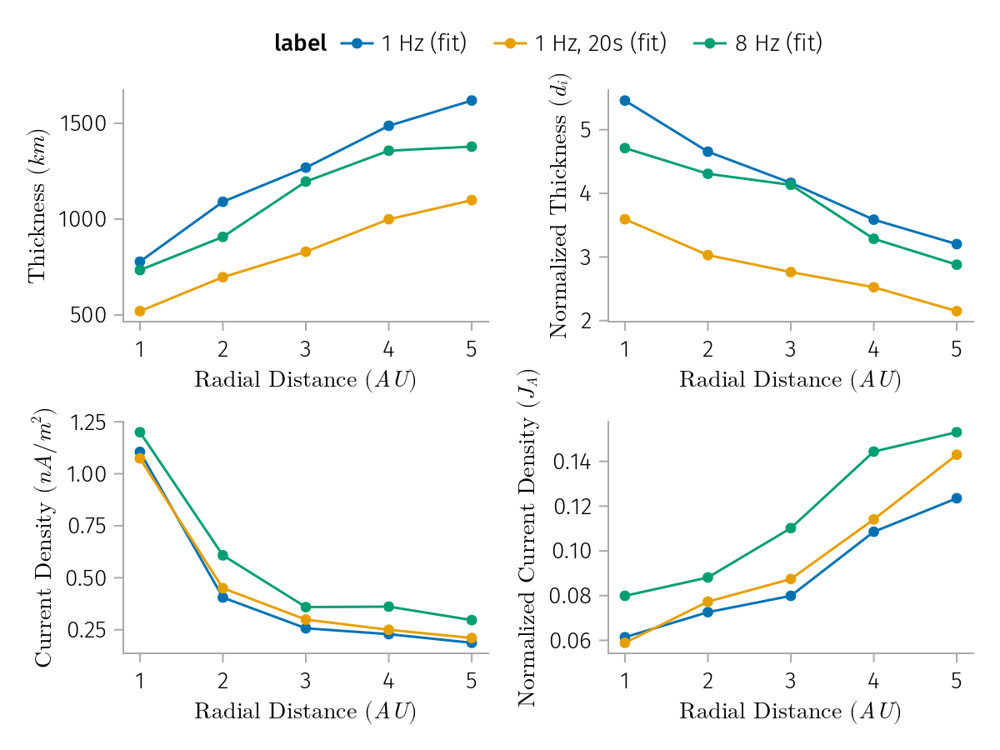

In [92]:
plot_median_r(j_events)

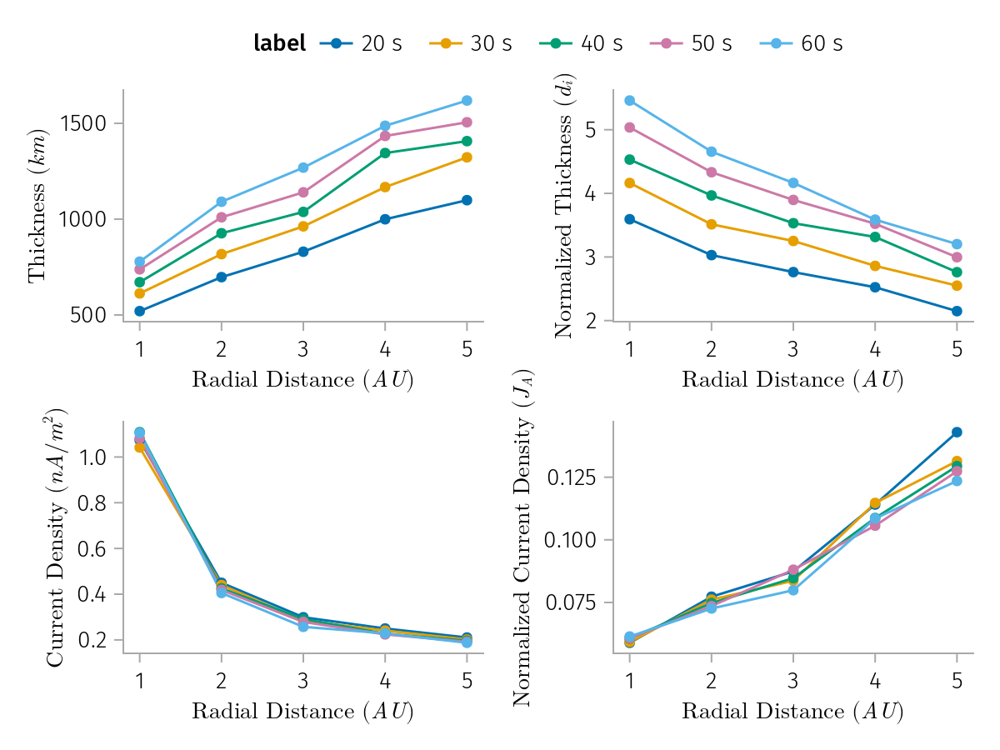

In [91]:
plot_median_r(j_events_taus)

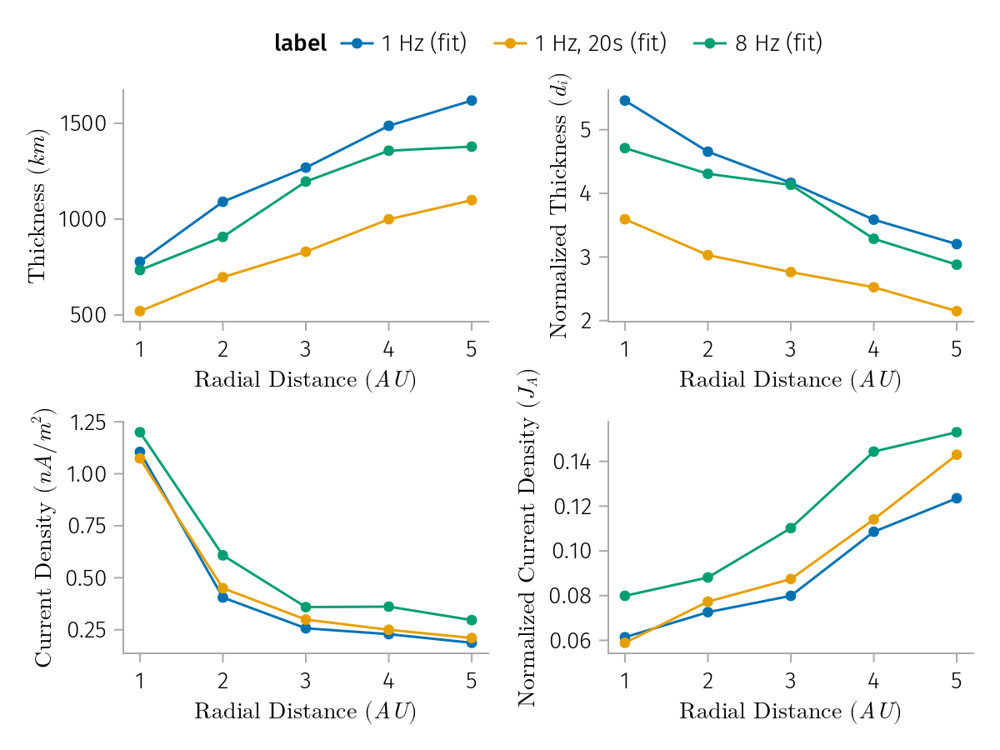

In [82]:
plot_median_r(j_events)

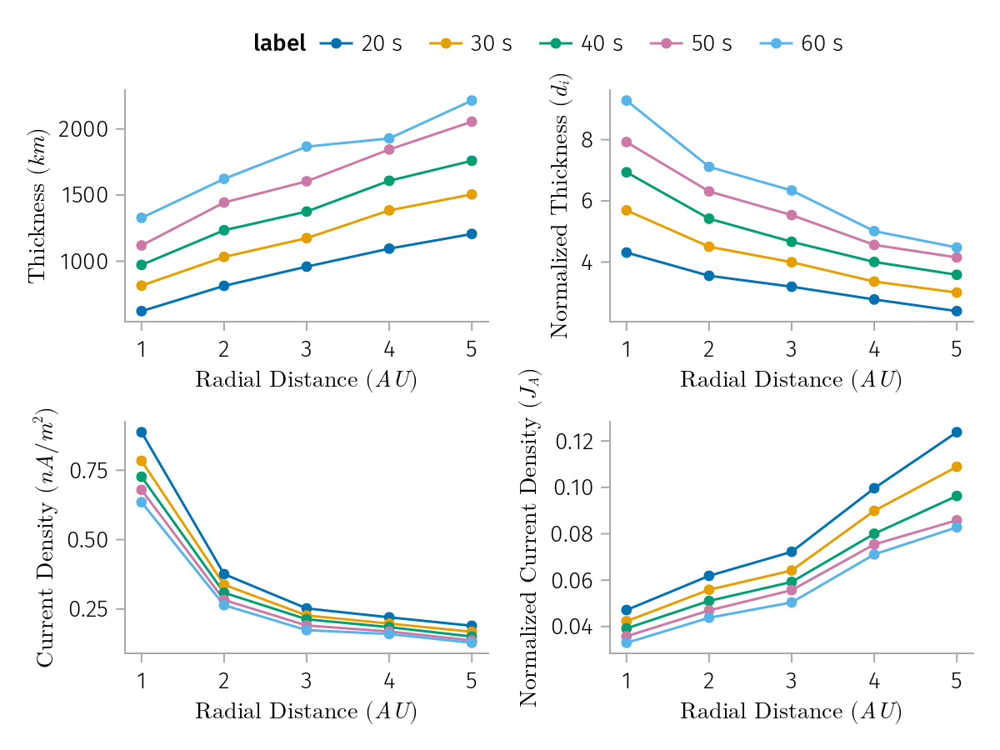

In [81]:
plot_median_r(j_events_taus)

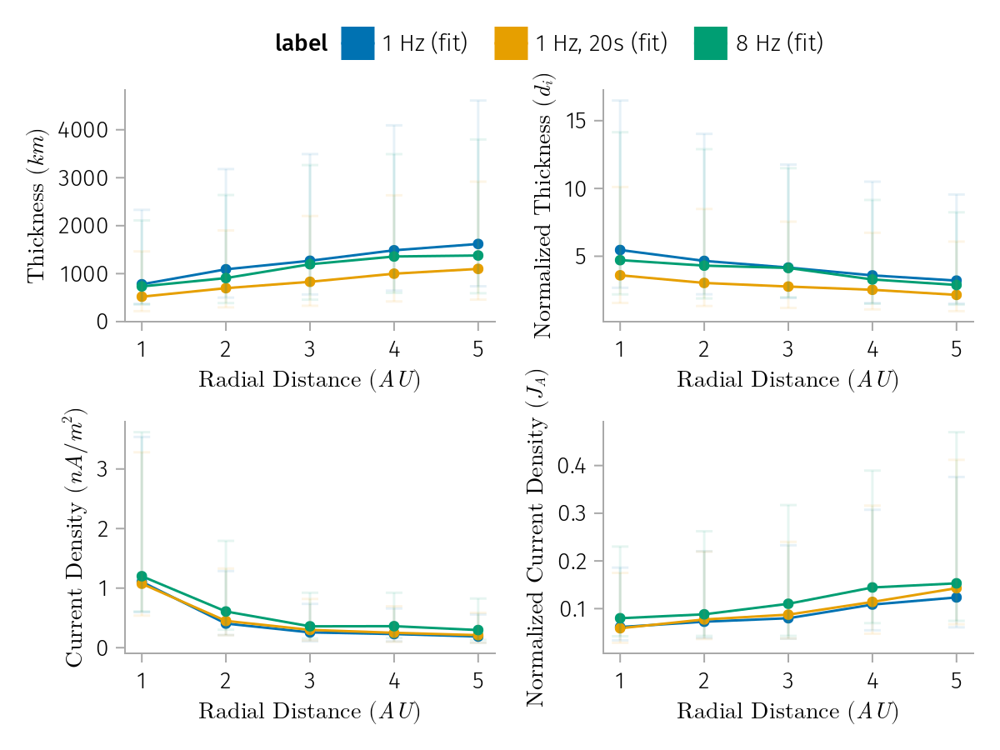

In [124]:
plot_median_r(j_events; add_error=true)

### Plot different radial distances in the same plot

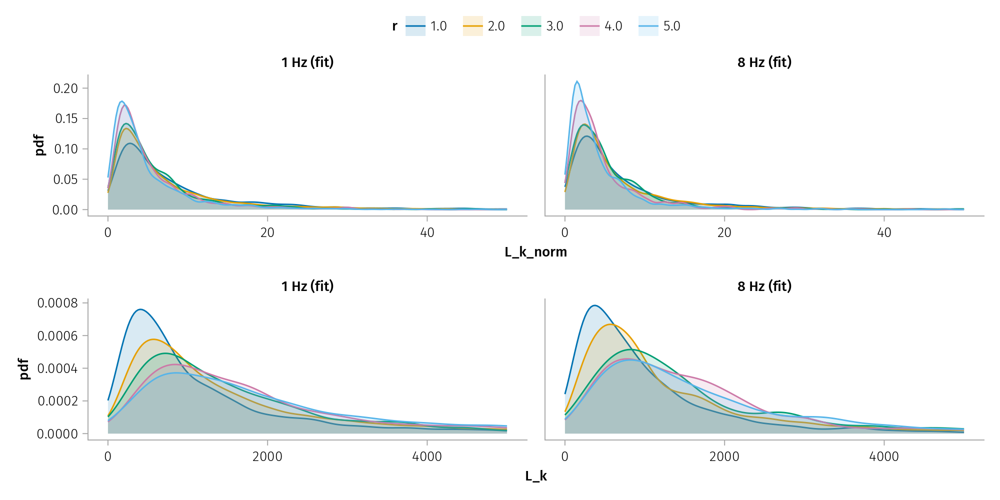

In [54]:
#| label: fig-l-r-fit
function plot_l_r_one(df)
    fig = Figure(size=(1000, 500))

    plt = data(df) * mapping(col=:label, color=:r)
    
    grid1 = draw!( fig[1, 1:2], plt * mapping(:L_k_norm) * density(datalimits=((0, 50),)) )
    grid2 = draw!( fig[2, 1:2], plt * mapping(:L_k) * density(datalimits=((0, 5000),)) )
    legend!(fig[0, 1:end], grid1, titleposition=:left, orientation=:horizontal)

    fig
end

plot_l_r_one(j_events)

## Plasma properties with radial distance

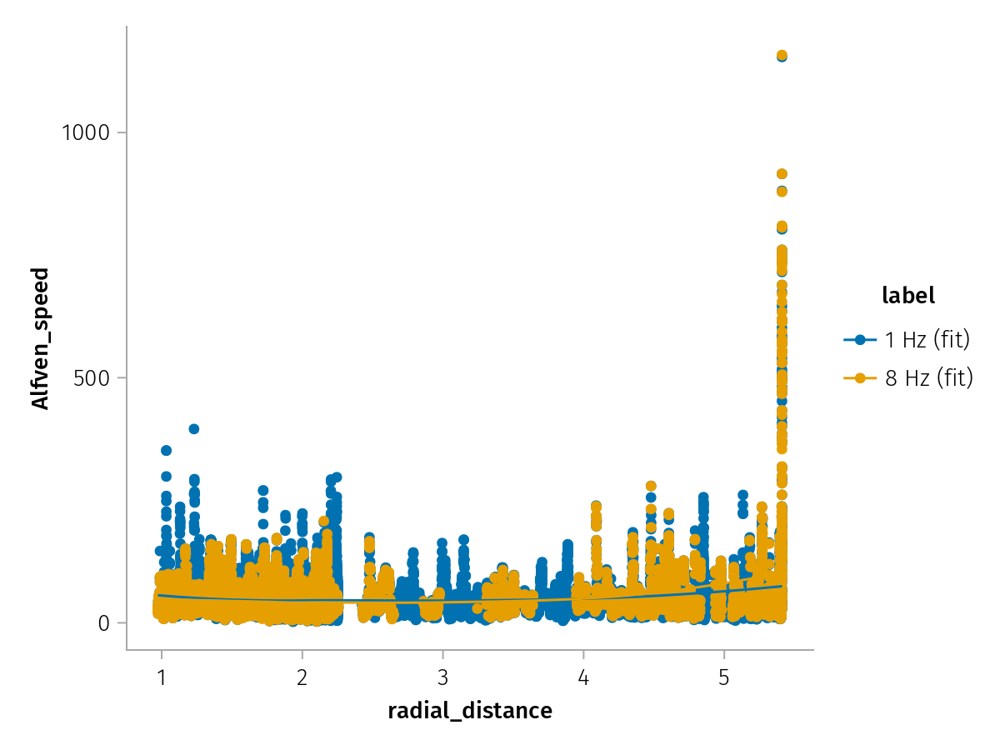

In [66]:
plt = data(j_events) * mapping(:radial_distance, :Alfven_speed, color=:label) * (visual(Scatter) + smooth())
plt |> draw

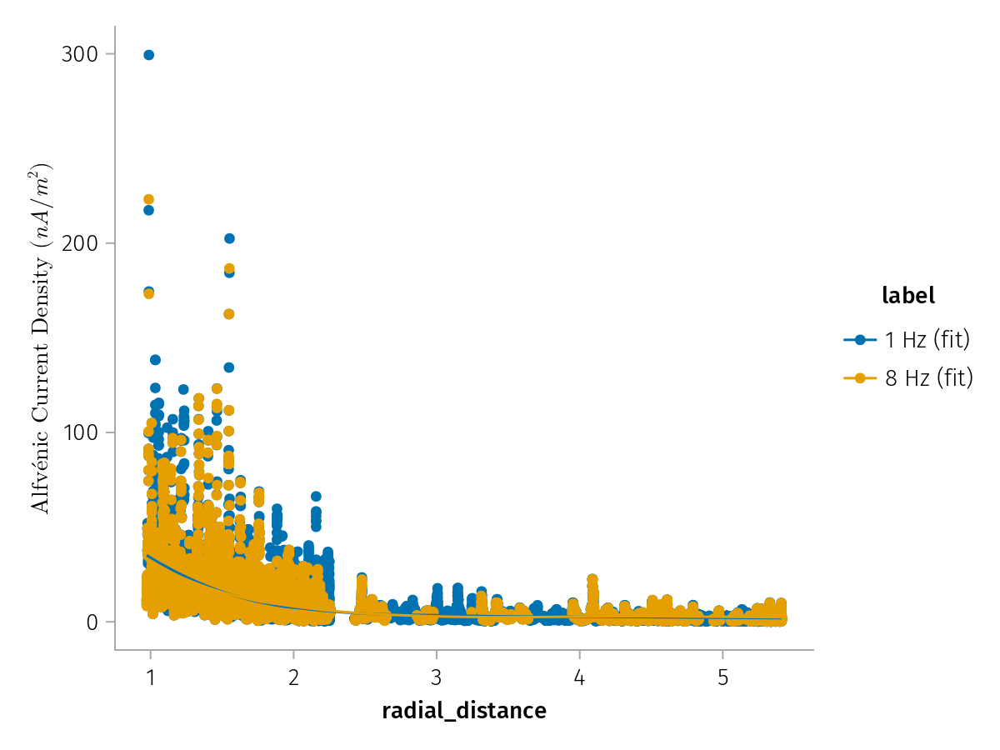

In [64]:
plt = data(j_events) * mapping(:radial_distance, jA_map, color=:label) * (visual(Scatter) + smooth())
plt |> draw

In [79]:
using Statistics

In [86]:
# groupby r and describe the data for each group 
# j_events |> @groupby(_.r) |> @map({r=key(_), j0_k=describe(_.j0_k), L_k=describe(_.L_k)})
@chain j_events begin
    groupby(:r)
    combine(:plasma_density =>  mean, :ion_inertial_length => mean, :b_mag => mean) 
end

Row,r,plasma_density_mean,ion_inertial_length_mean,b_mag_mean
,String,Float64,Float64,Float64
1,1.0,3.10512,152.217,3.75957
2,2.0,1.42267,242.722,2.10041
3,3.0,0.674452,317.706,1.45649
4,4.0,0.417696,434.665,1.3097
5,5.0,0.343857,569.222,1.27077


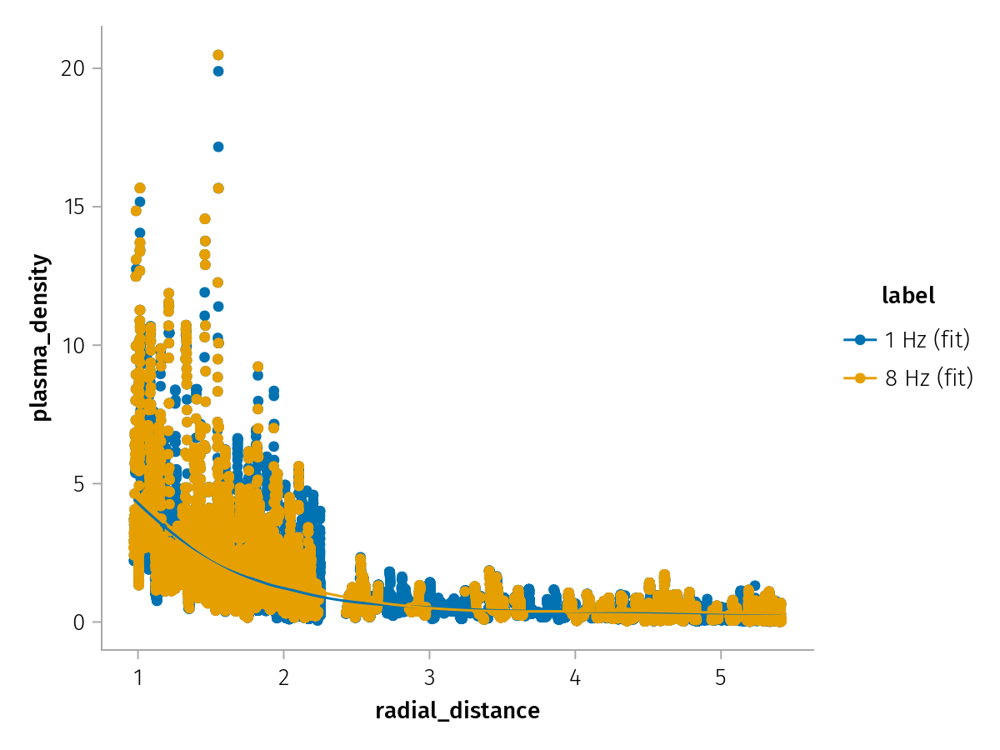

In [67]:
plt = data(j_events) * mapping(:radial_distance, :plasma_density, color=:label) * (visual(Scatter) + smooth())
plt |> draw

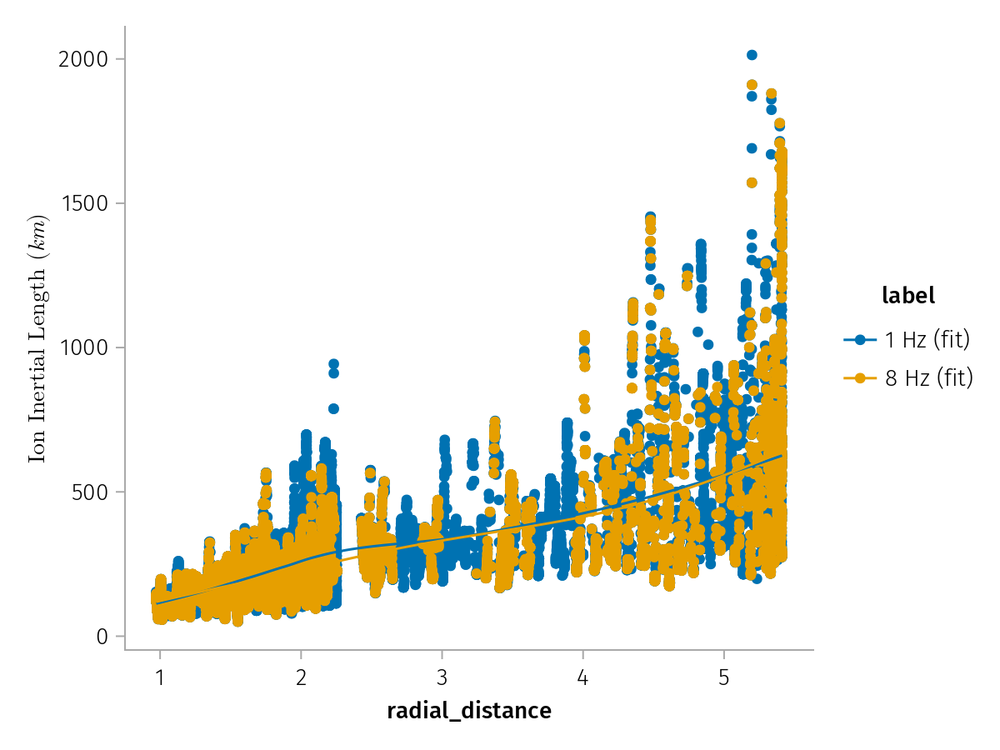

In [65]:
plt = data(j_events) * mapping(:radial_distance, di_map, color=:label) * (visual(Scatter) + smooth())
plt |> draw

## Check discontinuities properties in relation to the local plasma properties

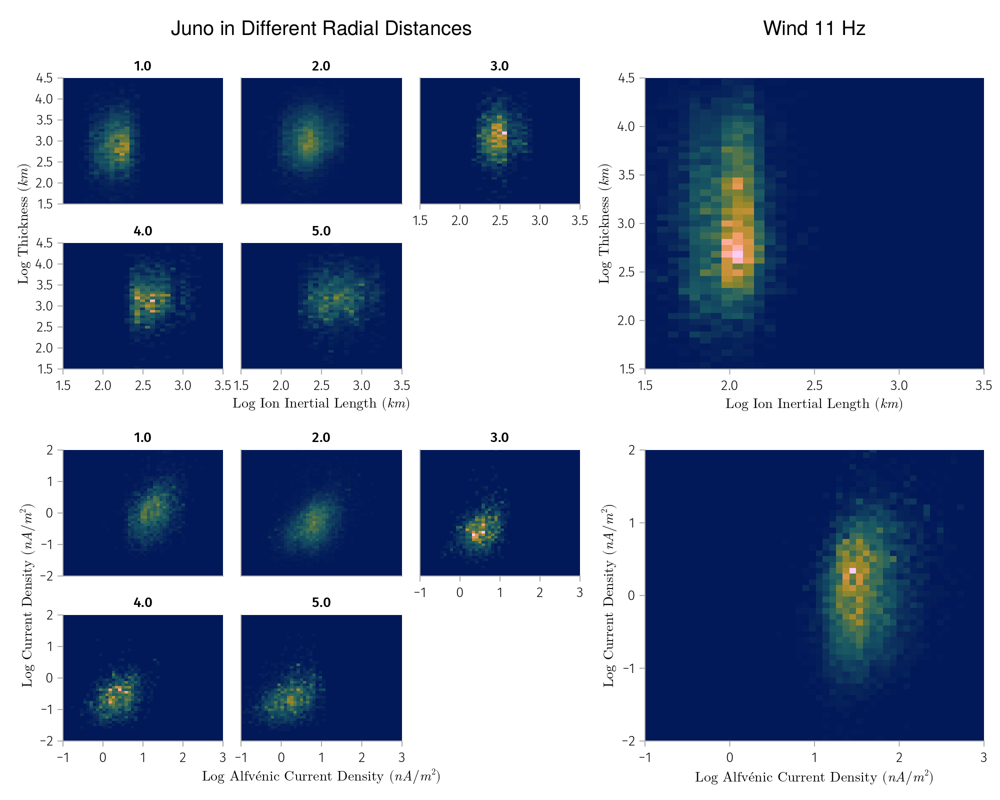

In [ ]:
#| label: fig-local-comp-map
#| column: page
begin
    fig = Figure(size=(1000, 800))

    datalayer = mapping() * visual(Scatter, markersize=1, color=:white, alpha=0.1)

    begin
        layer = histogram(bins=range(1, 5, length=64), normalization=:pdf)
        plt = layer * mapping(di_log_map, l_log_map)
        plt1 = data(j_events) * mapping(layout=:r) * plt
        plt2 = data(w_events) * plt
    
        l_log_limit = ((1.5, 3.5), (1.5, 4.5))
        axis = (;limits=l_log_limit)
        draw!(fig[1:2,1:3], plt1, axis=axis)
        draw!(fig[1:2,4:5], plt2, axis=axis) 
    end

    # Current Density Panels
    begin
        layer = histogram(bins=range(-2, 3, length=64), normalization=:pdf)
        plt = layer * mapping(jA_log_map, j_log_map)
        plt3 = data(j_events) * mapping(layout=:r) * plt
        plt4 = data(w_events) * plt
    
        j_log_limit = ((-1, 3), (-2, 2))
        axis = (;limits=j_log_limit)
        draw!(fig[3:4,1:3], plt3, axis=axis)
        draw!(fig[3:4,4:5], plt4, axis=axis)
    end

    # Make ablines across different r panels
    # begin
        # ablines_data = (; intercepts=[-3,-1,1], slopes=[1,1,1]) 
        # lines = data(ablines_data) * mapping(:intercepts, :slopes) * visual(ABLines, linestyle=:dash)
        # draw!(fig[3:4,1:3], lines)
    # end

    Label(fig[0,1:3], "Juno in Different Radial Distances", fontsize=20)
    Label(fig[0,4:5], "Wind 11 Hz", fontsize=20)

    fig
end

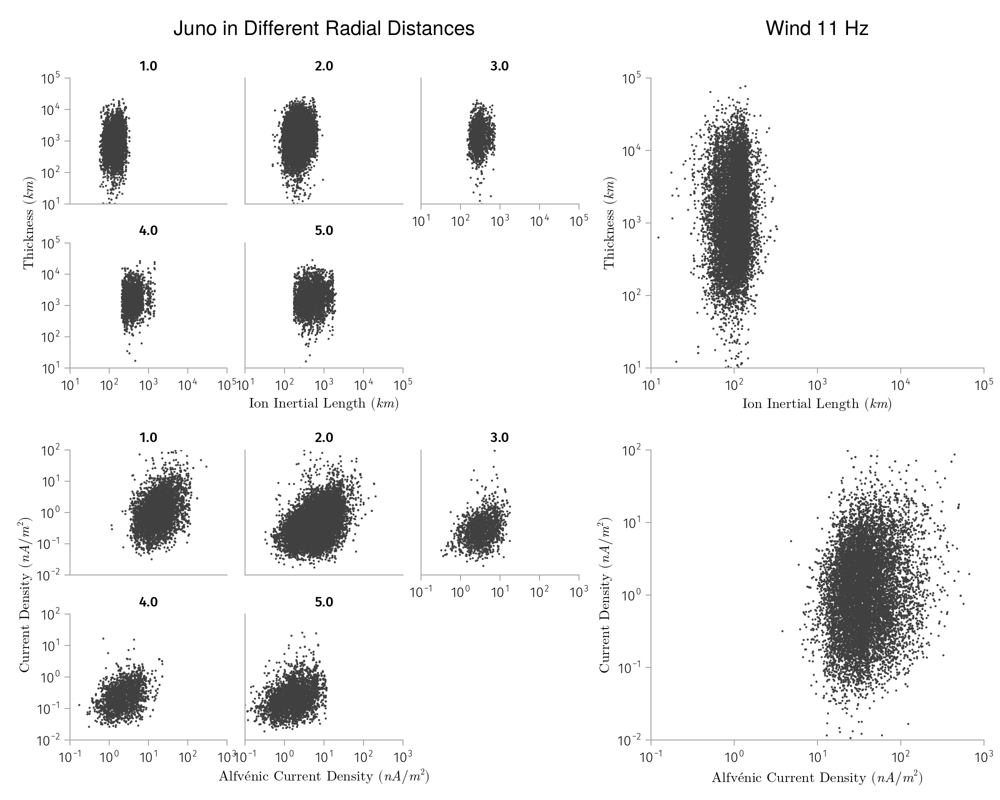

In [ ]:
#| label: fig-l-comp
begin
    fig = Figure(size=(1000, 800))

    pdflayer = density() * visual(Contour)
    # small scatter points
    datalayer = mapping() * visual(Scatter, markersize=3)

    # layer = pdflayer + datalayer
    layer = datalayer
    plt = layer * mapping(di_map, l_map)
    plt1 = data(j_events) * mapping(layout=:r) * plt
    plt2 = data(w_events) * plt

    l_limit = ((10^1, 10^5), (10^1, 10^5))
    axis = merge(log_axis, (;limits=l_limit))
    draw!(fig[1:2,1:3], plt1, axis=axis)
    draw!(fig[1:2,4:5], plt2, axis=axis)

    plt = layer * mapping(jA_map, j_map)
    plt3 = data(j_events) * mapping(layout=:r) * plt
    plt4 = data(w_events) * plt

    j_limit = ((10^-1, 10^3), (10^-2, 10^2))
    axis = merge(log_axis, (;limits=j_limit))
    draw!(fig[3:4,1:3], plt3, axis=axis)
    draw!(fig[3:4,4:5], plt4, axis=axis)


    Label(fig[0,1:3], "Juno in Different Radial Distances", fontsize=20)
    Label(fig[0,4:5], "Wind 11 Hz", fontsize=20)

    fig
end

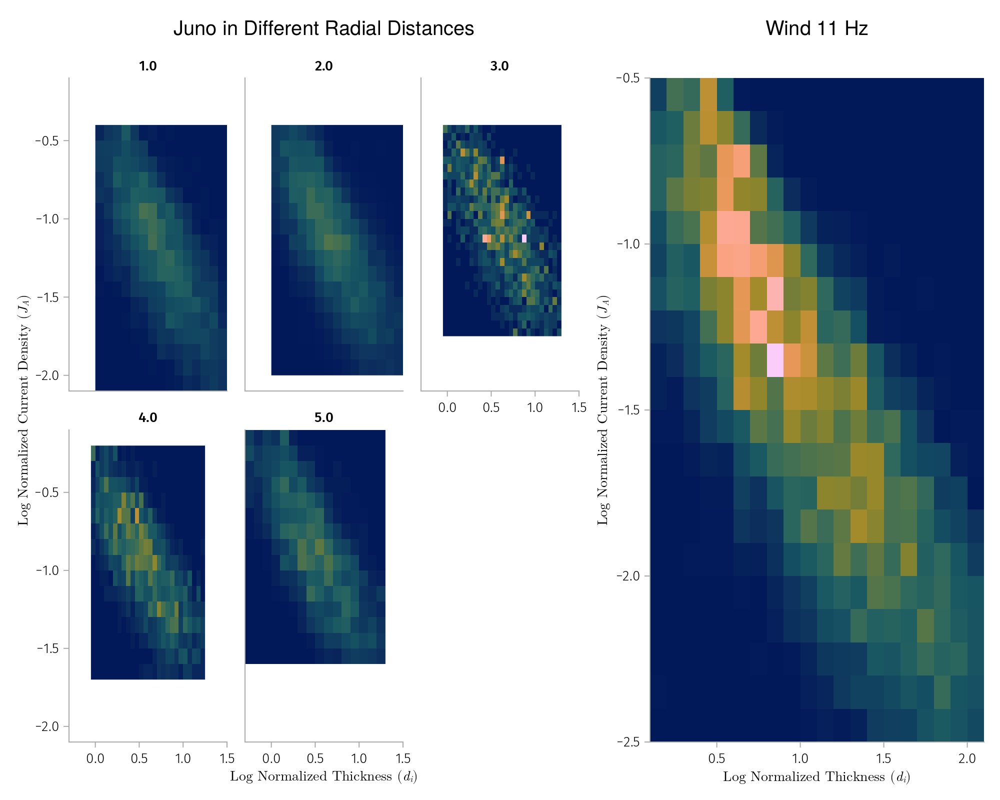

In [ ]:
begin
    fig = Figure(size=(1000, 800))
    datalimits_f = x -> quantile(x, [0.05, 0.95])

    begin
        layer = histogram(bins=24, datalimits=datalimits_f, normalization=:pdf)
        plt = layer * mapping(l_norm_log_map, j_norm_log_map)
        plt1 = data(j_events) * mapping(layout=:r) * plt
        plt2 = data(w_events) * plt

        axis = (;)
        draw!(fig[1:2, 1:3], plt1, axis=axis)
        draw!(fig[1:2, 4:5], plt2, axis=axis)
    end

    Label(fig[0, 1:3], "Juno in Different Radial Distances", fontsize=20)
    Label(fig[0, 4:5], "Wind 11 Hz", fontsize=20)

    fig
end

fig

## Derivative method validation

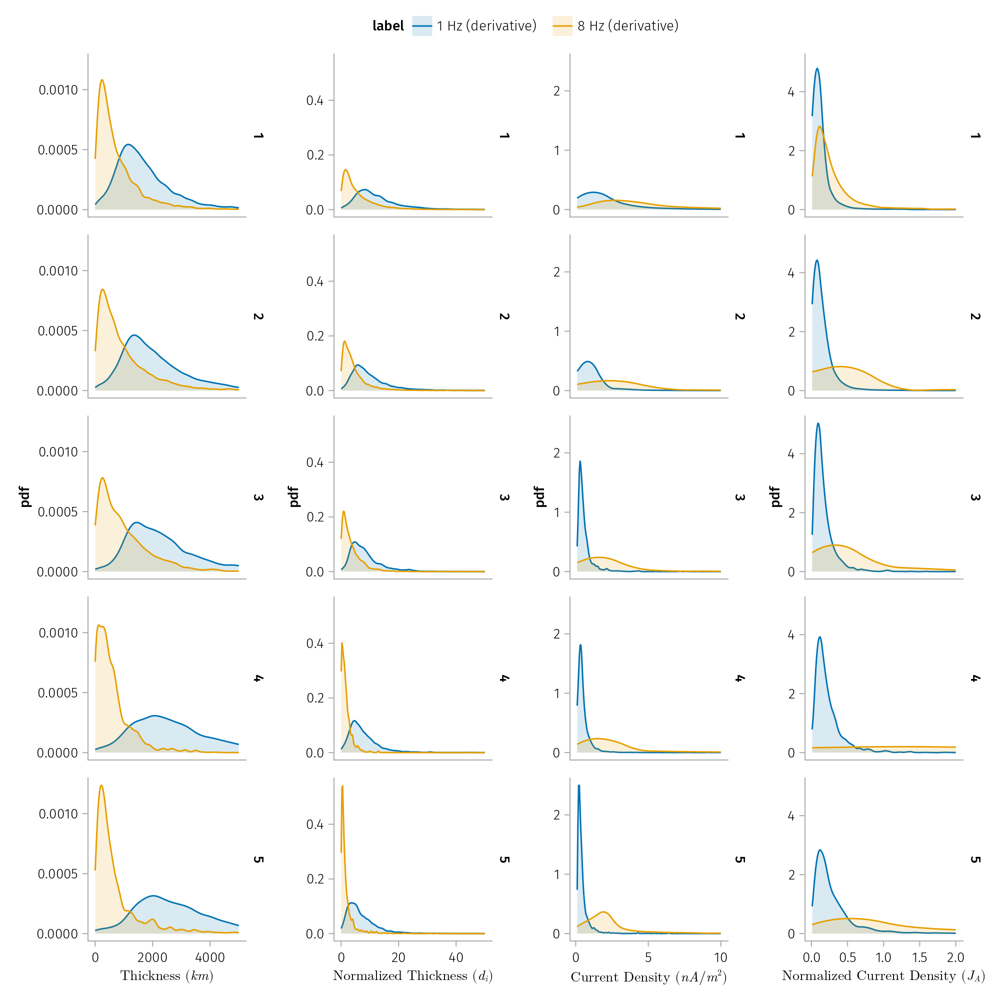

In [16]:
#| label: fig-l-j-r-der

fig = plot_l_j_r(j_events_der)
fig